In [9]:
import numpy as np
import matplotlib.pyplot as plt

import librosa
import librosa.display
import soundfile as sf
import speech_recognition as sr

from jiwer import wer,cer
from IPython.display import Audio, display

import whisper
import csv
import os
import tempfile
import wave
from gtts import gTTS


In [10]:
audio_signal, sample_rate = librosa.load(r'C:\Users\hp\Desktop\Tech Mango\Datasets\speech_01.wav', sr=None)

In [13]:
sample_rate

44100

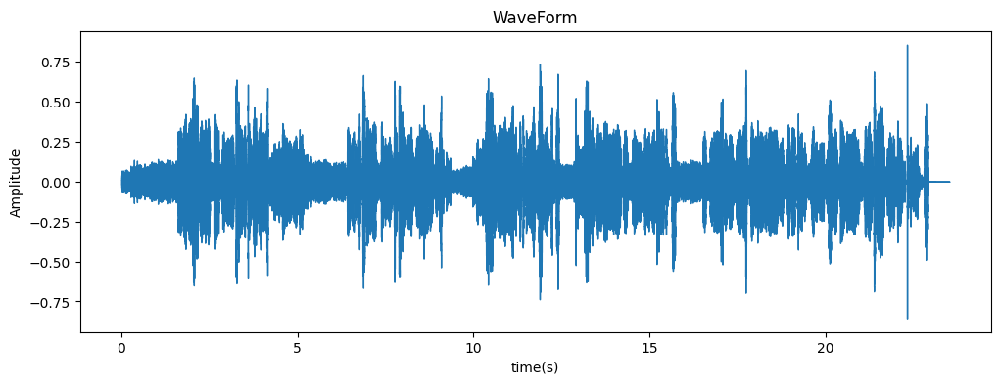

In [15]:
plt.figure(figsize=(12,4))
librosa.display.waveshow(audio_signal, sr=sample_rate)
plt.title('WaveForm')
plt.xlabel('time(s)')
plt.ylabel('Amplitude')
plt.show()

Audio(r'C:\Users\hp\Desktop\Tech Mango\Datasets\speech_01.wav')

In [21]:
recognizer = sr.Recognizer()

In [52]:
file_path = r'C:\Users\hp\Desktop\Tech Mango\Datasets\speech_filter.wav'

In [27]:
def transcribe_audio(file_path):
    with sr.AudioFile(file_path) as source:
        audio_data = recognizer.record(source)
        text = recognizer.recognize_google(audio_data)
        print(text)
        return text
transcribe_text = transcribe_audio(file_path)

my name is Ivan and I am excited to have you as part of our internet before we get started I want to tell you a little bit about myself I am a sound engineer designs in artificial intelligence my profession with the focus on audio it and Communications


In [30]:
ground_truth = '''my name is Ivan and I am excited to have you as part of our internet community! Before we get started, I'd like to tell you a little bit about myself. I'm a sound engineer turned data scientist, curious about machine learning and artificial intelligence. my professional background is primarily in media production, with a focus on audio,IT and Communications'''

In [31]:
cal_WER = wer(ground_truth, transcribe_text)
cal_CER = cer(ground_truth, transcribe_text)
print(f"WER: {cal_WER:.4f}")
print(f"CER: {cal_CER:.4f}")

WER: 0.4500
CER: 0.3426


In [32]:
Spect = librosa.stft(audio_signal)

In [33]:
Spect_db = librosa.amplitude_to_db(abs(Spect), ref=np.max)

In [34]:
np.max(Spect_db)

np.float32(0.0)

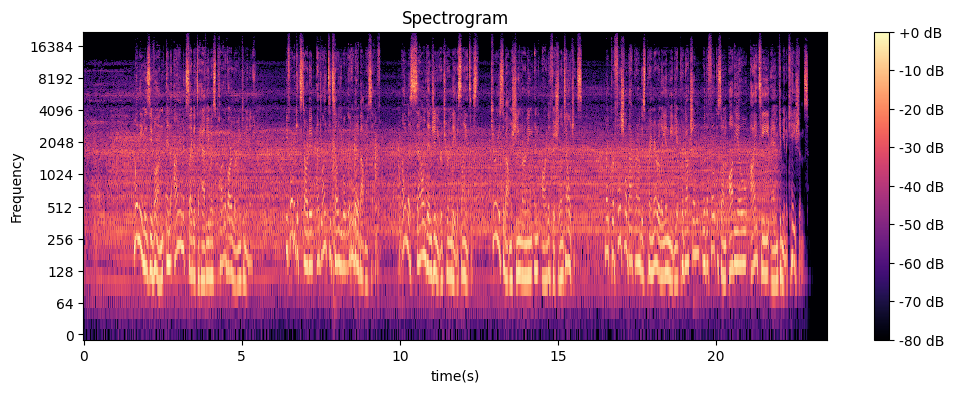

In [35]:
plt.figure(figsize=(12,4))
librosa.display.specshow(data=Spect_db, sr=sample_rate, x_axis='time',y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram')
plt.xlabel('time(s)')
plt.ylabel('Frequency')
plt.show()

In [136]:
audio_filter = librosa.effects.preemphasis(audio_signal,coef=0.3)
sf.write(r'C:\Users\hp\Desktop\Tech Mango\Datasets\speech_filter.wav' , audio_filter, sample_rate)
output_file = r'C:\Users\hp\Desktop\Tech Mango\Datasets\speech_filter.wav'

In [137]:
print("Play Original Audio:")
Audio(file_path)

Play Original Audio:


In [138]:
print("Play Filtered Audio:")
Audio(output_file)

Play Filtered Audio:


In [139]:
Spect_1 = librosa.stft(audio_signal)

In [140]:
Spect_db_1 = librosa.amplitude_to_db(abs(Spect_1), ref=np.max)

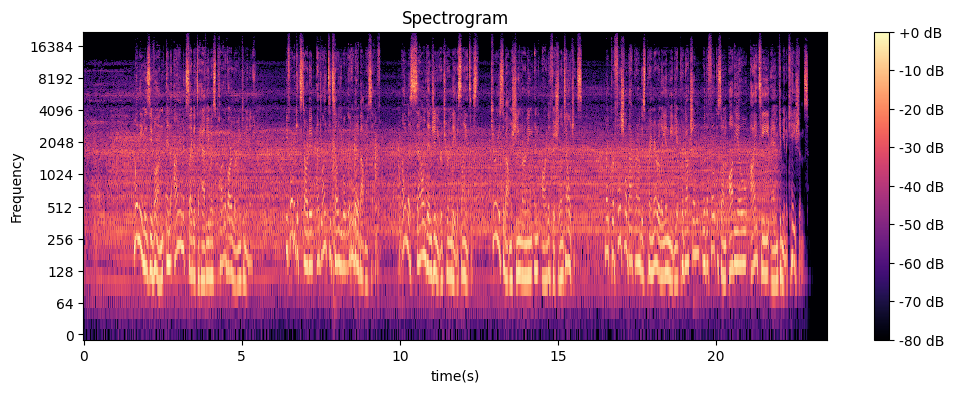

In [141]:
plt.figure(figsize=(12,4))
librosa.display.specshow(data=Spect_db_1, sr=sample_rate, x_axis='time',y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram')
plt.xlabel('time(s)')
plt.ylabel('Frequency')
plt.show()

In [142]:
recognizer = sr.Recognizer()

In [143]:
def transcribe_audio(file_path):
    with sr.AudioFile(file_path) as source:
        audio_data = recognizer.record(source)
        try:
            text = recognizer.recognize_google(audio_data)
            print("Transcription:\n", text)
            return text
        except sr.UnknownValueError:
            print("Google Speech Recognition could not understand audio")
        except sr.RequestError as e:
            print("Could not request results; {0}".format(e))

transcribe_text = transcribe_audio(output_file)

Transcription:
 my name is Ivan and I am excited to have you as part of our internet before we get started I want to tell you a little bit about myself I am a sound engineer designs in artificial intelligence my profession audio it and Communications


In [144]:
cal_WER = wer(ground_truth, transcribe_text)
cal_CER = cer(ground_truth, transcribe_text)
print(f"WER: {cal_WER:.4f}")
print(f"CER: {cal_CER:.4f}")

WER: 0.4833
CER: 0.3760


WHISPER OPENAI

In [146]:
model = whisper.load_model("base")

100%|███████████████████████████████████████| 139M/139M [00:43<00:00, 3.33MiB/s]


In [162]:
file_path = r'C:\Users\hp\Desktop\Tech Mango\Datasets\speech_01.wav'

In [163]:
result = model.transcribe(file_path)

C:\Users\hp\.conda\envs\speech_env\lib\site-packages\whisper\transcribe.py:132: UserWarning: FP16 is not supported on CPU; using FP32 instead
  warnings.warn("FP16 is not supported on CPU; using FP32 instead")


In [164]:
transcribe_text_whisper = result["text"]
transcribe_text_whisper

" My name is Yvonne and I am excited to have you as part of our learning community. Before we get started, I'd like to tell you a little bit about myself. I'm a sound engineer turned a scientist, curious about machine learning and artificial intelligence. My professional background is primarily in media production, with a focus on audio, IT and communications."

In [165]:
cal_WER = wer(ground_truth, transcribe_text_whisper)
cal_CER = cer(ground_truth, transcribe_text_whisper)
print(f"WER: {cal_WER:.4f}")
print(f"CER: {cal_CER:.4f}")

WER: 0.1500
CER: 0.0557


TRANSCRIPTIONS FOR MULTIPLE AUDIO_FILES

In [178]:
directory_path = r"C:\Users\hp\Desktop\Tech Mango\Datasets\Recordings\Recordings"

In [179]:
def transcribe_whisper(directory_path):
    transcriptions = []
    for file_name in os.listdir(directory_path):
        if file_name.endswith(".wav"):
            files_path = os.path.join(directory_path,file_name)
            result = model.transcribe(files_path)
            transcription = result["text"]
            transcriptions.append({"file_name": file_name, "transcription": transcription})
    return transcriptions

In [183]:
transcription=transcribe_whisper(directory_path)
transcription

[{'file_name': 'Track1.wav',
  'transcription': " I'm a sound engineer turned data scientist. Curious about machine learning and artificial intelligence."},
 {'file_name': 'Track2.wav',
  'transcription': ' My professional background is primarily in media production with a focus on audio, IT, and communications.'},
 {'file_name': 'Track3.wav',
  'transcription': " Over the years, I've developed a strong interest in digital signal processing sound and music computing."},
 {'file_name': 'Track4.wav',
  'transcription': ' As a graduate of Sound Engineering, I make it a priority to strike a balance between art and technology and my work.'},
 {'file_name': 'Track5.wav',
  'transcription': ' I believe that nowadays, data is the key to everything.'},
 {'file_name': 'Track6.wav',
  'transcription': ' Not only can it provide a rational explanation for complicated scientific puzzles.'},
 {'file_name': 'Track7.wav',
  'transcription': ' But it can also give you efficient methodologies for solving

STROING THIS INTO CSV FILES

In [189]:
output_file = "transcriptions_audio.csv"

with open(output_file, mode='w',newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["Track Number", "File Name", "Transcription"])
    for number, transcription in enumerate(transcriptions,start=1):
        writer.writerow([number, transcription['file_name'], transcription['transcription']])

TEXT TO SPEECH

In [190]:
text = '''"Good morning everyone, and thank you for joining us today. Over the past decade, we've witnessed a rapid acceleration in digital transformation across all industries. From automated customer support to predictive analytics in healthcare, artificial intelligence is no longer just a concept—it's a fundamental tool. As we move forward, our goal is to ensure that technology remains inclusive, secure, and empowering for every individual, regardless of their background. Let’s work together to build a smarter and more sustainable future.'''

tts = gTTS(text=text, lang='en')
tts.save("Audio.mp3")

os.system("start audio.mp3")

0